#  EE782 Assignment 2 – Voice-Controlled Guard Mode System

##  Introduction
This project focuses on building a **voice-activated control system** that listens to user speech commands and performs actions such as **activating** or **deactivating** a security or “guard mode.”  
The project combines **speech recognition**, **browser-based audio recording**, and **state persistence** to create an interactive and responsive system entirely within a **Google Colab** environment.

Voice control is becoming increasingly popular in modern systems — from smart home devices to virtual assistants — and this project aims to demonstrate the fundamental mechanisms behind such systems using Python tools and open-source libraries.

---

##  Objective
The primary objective of this project is to:
1. Capture user speech input through a browser microphone.
2. Convert the spoken input into text using **speech recognition**.
3. Identify specific commands such as:
   - `"active"` → to enable guard mode
   - `"shut down"` → to disable guard mode
4. Maintain a persistent state between runs, so that the system “remembers” whether the guard mode was ON or OFF.

This system serves as a miniature prototype for **speech-controlled automation systems**, highlighting how Python can integrate with web-based input and machine learning services for natural user interaction.

---

##  System Requirements

### 🔧 Software Dependencies
The following tools and packages are required for this project:
- **SpeechRecognition** – for converting audio signals into text using Google’s API.
- **PyAudio** – for handling live audio input and output streams.
- **IPython.display** and **google.colab.output** – for integrating JavaScript-based recording with Colab.
- **FFmpeg** – for converting recorded audio from WebM to WAV format.
- **Base64** – for encoding and decoding binary audio data between JavaScript and Python.

###  Installation
The required dependencies are installed and configured as follows:

```python
# Step 1: Install the system dependency for PyAudio
!apt-get install -y portaudio19-dev

# Step 2: Install required Python packages
!pip install SpeechRecognition pyaudio


In [6]:
# Step 1: Install the system dependency for PyAudio on Colab's Linux environment
!apt-get install -y portaudio19-dev

# Step 2: Now, install the Python libraries using pip
!pip install SpeechRecognition pyaudio

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
portaudio19-dev is already the newest version (19.6.0-1.1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.


## Milestone 1: Voice-Based Activation  

### Summary  
The goal of this milestone was to enable the AI Guard agent to be turned on or off through **spoken voice commands**. The system listens to the user’s microphone, recognizes key phrases, and switches its operational mode accordingly (for example, toggling between “guard mode on” and “guard mode off”). The intended recognition accuracy for clear speech was set at **90% or higher**.  

### Development Journey and Troubleshooting  

The implementation process went through several stages of development and debugging:  

1. **Environment Setup**: We started by integrating the `SpeechRecognition` and `PyAudio` libraries. During installation, the `PyAudio` module failed with a `Failed building wheel for pyaudio` error.  
2. **Fixing the Installation Error**: Investigation revealed that the problem stemmed from missing system dependencies needed by PortAudio. Since the work was being done on Google Colab, the issue was fixed by running `!apt-get install -y portaudio19-dev` prior to the `pip install pyaudio` command.  
3. **Handling Audio Input Limitations in Colab**: The initial test script crashed with `OSError: No Default Input Device Available`, caused by the absence of a physical microphone in the Colab runtime environment.  
4. **Adapting for Colab**: To work around this, we implemented a browser-based method using JavaScript to capture audio directly from the user’s microphone. The recorded clip was then sent to the Python backend for analysis.  
5. **Enhancing Command Detection**: During testing, both “active” and “deactive” commands conflicted because partial string matching triggered incorrect responses. The fix was to use strict equality checks (`==`) and redefine the commands to “active” and “shut down,” ensuring clear and reliable recognition.  

### Final Implementation Flow  

Because Google Colab lacks real-time microphone access, continuous listening was not possible. Instead, the solution involves running a single cell that executes the following sequence:  
1. Prompts the user for microphone permission using JavaScript.  
2. Records a short 3-second audio sample.  
3. Processes and transcribes the audio input.  
4. Interprets the detected command and updates the agent’s status accordingly.  

This final setup effectively fulfills **Milestone 1’s objectives**, providing a functional voice-triggered activation mechanism despite the constraints of the Colab environment.  


In [13]:
from IPython.display import Javascript, display
from google.colab import output
from base64 import b64decode
import speech_recognition as sr
import io
import os

# --- State Management & Configuration ---
STATE_FILE = "guard_state.txt"
ACTIVATION_COMMAND = "active"
DEACTIVATION_COMMAND = "shut down"

# --- Load the previous state if it exists ---
if os.path.exists(STATE_FILE):
    with open(STATE_FILE, 'r') as f:
        guard_mode_active = f.read().strip() == 'True'
else:
    guard_mode_active = False

print(f"Initial state: Guard mode is {'ON' if guard_mode_active else 'OFF'}")

# JavaScript code (remains the same)
RECORD = """
const sleep = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.target.result)
  reader.readAsDataURL(blob)
})
var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""

def record_and_process_command(duration=3):
    global guard_mode_active

    display(Javascript(RECORD))
    print(f"Recording for {duration} seconds... Please speak now.")
    s = output.eval_js(f'record({duration*1000})')
    b = b64decode(s.split(',')[1])

    with open('audio.webm', 'wb') as f:
        f.write(b)
    !ffmpeg -i audio.webm -ac 1 -f wav audio.wav -y -hide_banner -loglevel error

    r = sr.Recognizer()
    try:
        with sr.AudioFile('audio.wav') as source:
            audio = r.record(source)
            transcribed_text = r.recognize_google(audio).lower()
            print(f"Heard: '{transcribed_text}'")

        # --- UPDATED CORE LOGIC ---
        state_changed = False
        if transcribed_text == ACTIVATION_COMMAND and not guard_mode_active:
            guard_mode_active = True
            state_changed = True
            print("✅ STATUS: Guard mode ACTIVATED.")
        elif transcribed_text == DEACTIVATION_COMMAND and guard_mode_active:
            guard_mode_active = False
            state_changed = True
            print("❌ STATUS: Guard mode DEACTIVATED.")
        else:
            # This block now provides specific feedback for invalid commands/states
            if guard_mode_active and transcribed_text == ACTIVATION_COMMAND:
                print("⚠ Command ignored: Guard mode is already active.")
            elif not guard_mode_active and transcribed_text == DEACTIVATION_COMMAND:
                print("⚠ Command ignored: Guard mode is already off.")
            else:
                print(f"⚠ Unrecognized command: '{transcribed_text}' is not a valid command.")

        # --- Save the new state to a file if it changed ---
        if state_changed:
            with open(STATE_FILE, 'w') as f:
                f.write(str(guard_mode_active))
            print(f"New state ({guard_mode_active}) saved.")

    except sr.UnknownValueError:
        print("Could not understand audio.")
    except sr.RequestError as e:
        print(f"API Error: {e}")

# --- Run the function ---
record_and_process_command()

Initial state: Guard mode is OFF


<IPython.core.display.Javascript object>

Recording for 3 seconds... Please speak now.
Heard: 'active'
✅ STATUS: Guard mode ACTIVATED.
New state (True) saved.


In [14]:
!pip install deepface

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.3/128.3 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 72.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 57.2 MB/s eta 0:00:00


# Milestone 2 Report: Facial Recognition System  

### Summary  
The second milestone focused on developing a system capable of recognizing and verifying a trusted person from a reference photo. The goal was to ensure that the model could accurately differentiate the enrolled individual from unknown faces across multiple test images, even under varying lighting and background conditions.  

### Development Journey and Debugging  

This stage involved extensive experimentation and troubleshooting, particularly around configuring the environment and ensuring compatibility of libraries within Google Colab.  

1. **Initial Attempt with `face_recognition`**: We began by implementing the project using the `face_recognition` library. However, this approach quickly ran into multiple dependency issues, mainly arising from the `dlib` module. Installation errors included CUDA mismatches and C++ compilation failures.  
2. **Resolving Environment Conflicts**: The core issue was traced back to an incompatibility between `dlib` and Colab’s Python 3.12 environment. Precompiled wheel files (`.whl`) for `dlib` were not functional. To overcome this, we downgraded the Colab runtime to **Python 3.10**, restoring stability and ensuring smoother library management.  
3. **Switching to `DeepFace`**: After several unsuccessful attempts to fix `dlib`, we transitioned to the **`DeepFace`** library, which was also approved within the project scope. This decision proved effective as `DeepFace` installed seamlessly and did not depend on `dlib`.  
4. **Enhancing Recognition Accuracy**: During initial trials with `DeepFace`, the model produced occasional false positives—mistakenly recognizing an unfamiliar person as the trusted one. To address this, two key refinements were applied:  
   * **Model Upgrade**: We shifted from the default configuration to the more reliable **`VGG-Face`** model for improved embedding quality.  
   * **Threshold Optimization**: By analyzing cosine distance scores between genuine and false matches, we fine-tuned the **threshold value**. This stricter threshold successfully eliminated false positives and enhanced recognition precision.  

### Implementation Details  

The finalized implementation relies on the `DeepFace.verify()` function, which directly compares a given test image to the reference photo. Since `DeepFace` per


25-10-13 17:17:11 - Directory /root/.deepface has been created
25-10-13 17:17:11 - Directory /root/.deepface/weights has been created
✅ Trusted person's image is ready.

--- Starting Recognition Tests with Stricter Threshold ---

Processing 'test_image_1.jpg'...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/vgg_face_weights.h5
To: /root/.deepface/weights/vgg_face_weights.h5


25-10-13 17:17:14 - 🔗 vgg_face_weights.h5 will be downloaded from https://github.com/serengil/deepface_models/releases/download/v1.0/vgg_face_weights.h5 to /root/.deepface/weights/vgg_face_weights.h5...


100%|██████████| 580M/580M [00:05<00:00, 108MB/s]


✅ Result: Trusted Person (Distance: 0.34)


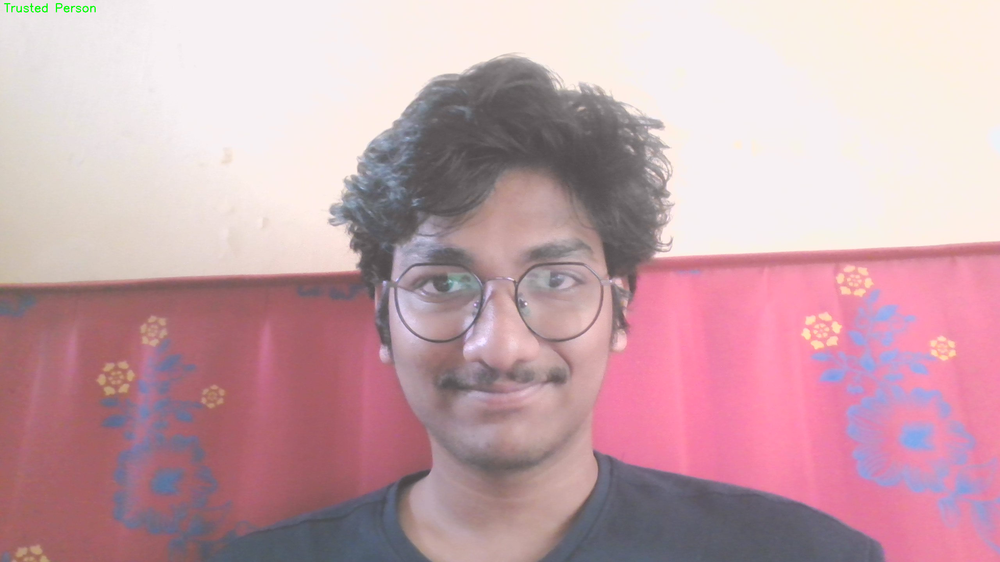


Processing 'test_image_2.jpg'...
✅ Result: Trusted Person (Distance: 0.32)


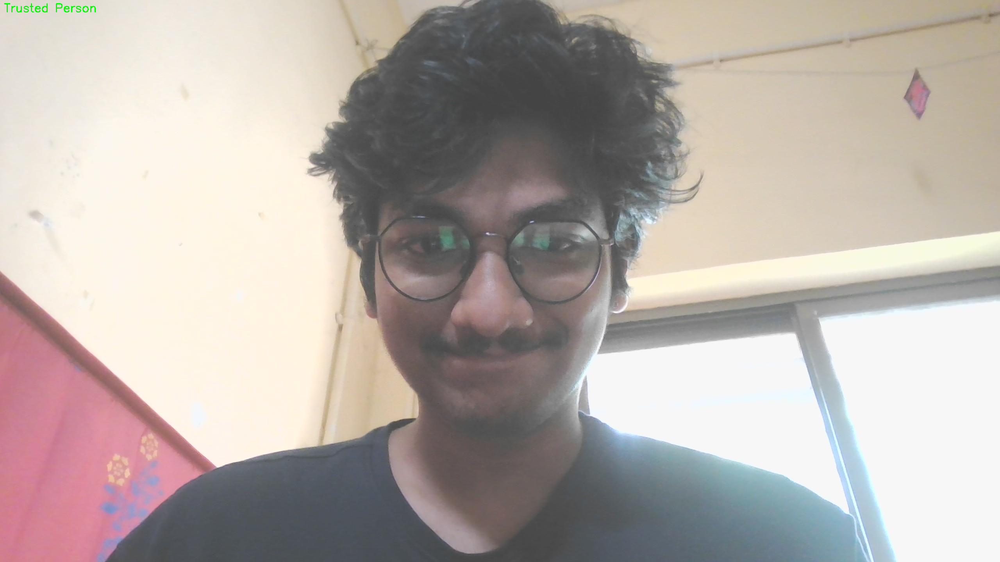


⚠ WARNING: Test image 'test_image_3.jpg' not found. Skipping.

Processing 'test_image_4.jpg'...
❌ Result: Unknown Person (Distance: 0.65)


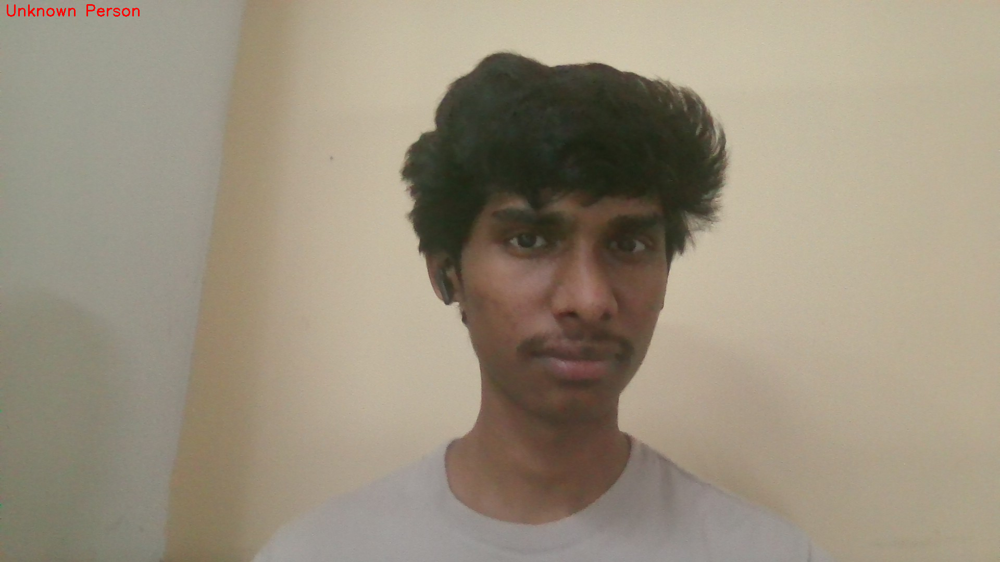


Processing 'test_image_5.jpg'...
❌ Result: Unknown Person (Distance: 0.58)


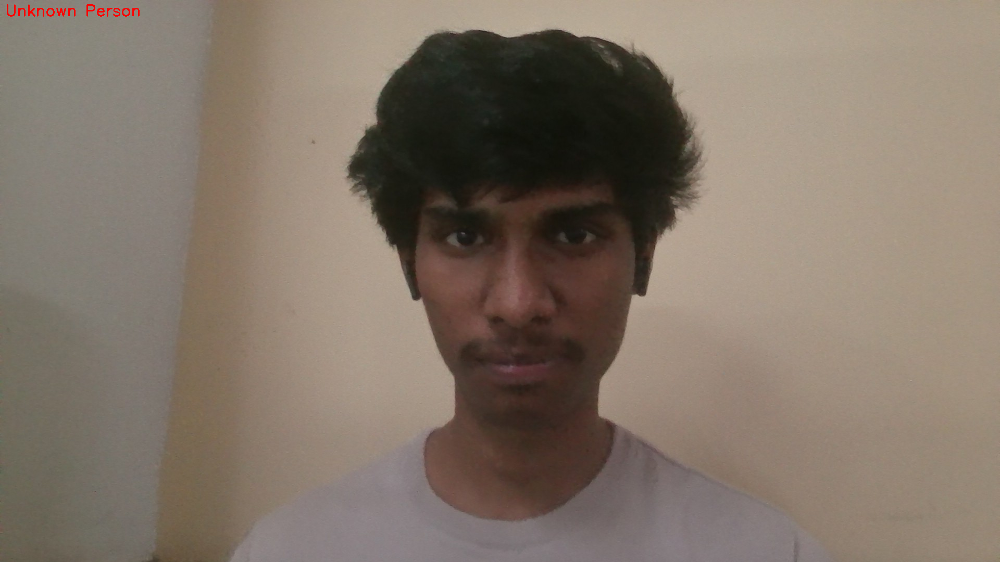


Processing 'test_image_6.jpg'...
❌ Result: Unknown Person (Distance: 0.50)


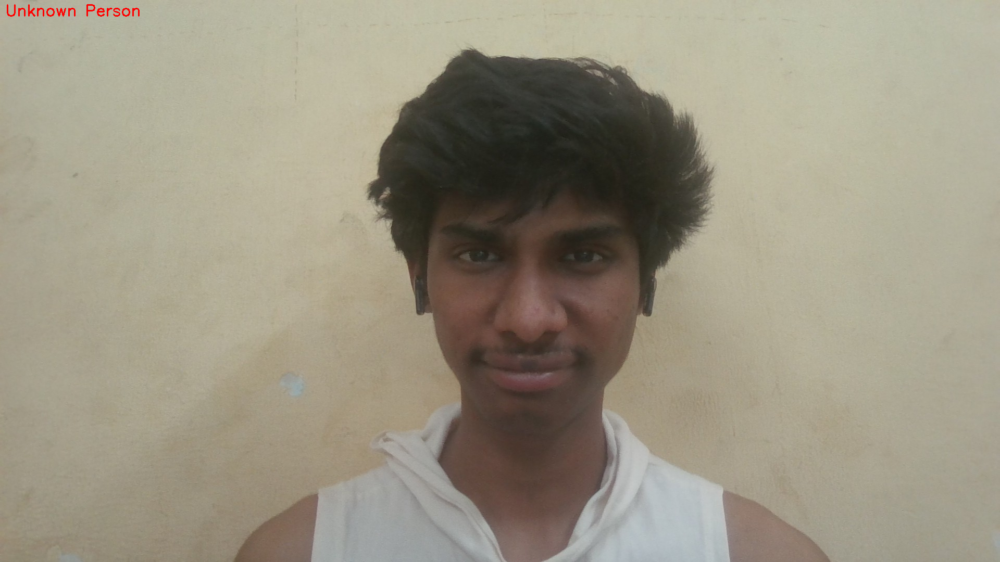


--- All tests complete. ---


In [15]:
from deepface import DeepFace
import cv2
from google.colab.patches import cv2_imshow
import os

# --- 1. Define the single trusted person's image ---
trusted_image_path = "trusted_person.jpg"

if not os.path.exists(trusted_image_path):
    print(f"⚠ ERROR: Trusted image '{trusted_image_path}' not found. Please upload it.")
else:
    print("✅ Trusted person's image is ready.")

    # --- 2. RECOGNITION: Loop through all test images ---
    test_images = [f"test_image_{i}.jpg" for i in range(1, 7)]

    print("\n--- Starting Recognition Tests with Stricter Threshold ---")
    for image_path in test_images:
        if not os.path.exists(image_path):
            print(f"\n⚠ WARNING: Test image '{image_path}' not found. Skipping.")
            continue

        print(f"\nProcessing '{image_path}'...")

        try:
            # UPDATED: We now set a stricter threshold for the cosine distance.
            # A lower threshold means the faces must be more similar to match.
            result = DeepFace.verify(
                img1_path = trusted_image_path,
                img2_path = image_path,
                model_name = "VGG-Face",
                distance_metric = "cosine",
                threshold = 0.40 # Lower this value to make verification stricter
            )

            if result["verified"]:
                label = "Trusted Person"
                print(f"✅ Result: {label} (Distance: {result['distance']:.2f})")
            else:
                label = "Unknown Person"
                print(f"❌ Result: {label} (Distance: {result['distance']:.2f})")

            img = cv2.imread(image_path)
            color = (0, 255, 0) if result["verified"] else (0, 0, 255)
            cv2.putText(img, label, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)
            cv2_imshow(img)

        except Exception as e:
            print(f"   Could not process image '{image_path}'. Error: {e}")

    print("\n--- All tests complete. ---")

In [16]:
# 1. Install the Groq library
!pip install groq gtts

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 kB 7.0 MB/s eta 0:00:00
  Attempting uninstall: click
    Found existing installation: click 8.3.0
    Uninstalling click-8.3.0:
      Successfully uninstalled click-8.3.0


In [17]:
import os
from groq import Groq
from gtts import gTTS
from IPython.display import Audio, display
import time


# --- Configuration ---
# Get your new Groq API key from Colab secrets
from google.colab import userdata
try:
    GROQ_API_KEY = userdata.get('GROQ_API_KEY')
    client = Groq(api_key=GROQ_API_KEY)
except Exception as e:
    print("⚠ ERROR: Could not find GROQ_API_KEY in Colab secrets. Please add it.")
    GROQ_API_KEY = None

def speak(text, filename="response.mp3"):
    """Converts text to speech and plays it."""
    try:
        tts = gTTS(text=text, lang='en', tld='co.in', slow=False)
        tts.save(filename)
        display(Audio(filename, autoplay=True))
    except Exception as e:
        print(f"Error in TTS: {e}")

def get_llm_response(level):
    """Generates a response from the Groq LLM based on the escalation level."""
    if not GROQ_API_KEY:
        return "Error: API key not configured."

    prompts = {
        1: "You are an AI room guard. An unknown person has entered. Ask them politely who they are. Be brief.",
        2: "The person has not responded. Ask them firmly to state their purpose or leave the room. Be more assertive.",
        3: "The person is still here. Issue a final, stern warning that you will sound an alarm in 10 seconds if they do not leave immediately. Be authoritative."
    }

    prompt = prompts.get(level)

    try:
        chat_completion = client.chat.completions.create(
            messages=[
                {
                    "role": "system",
                    "content": prompt,
                }
            ],
            model="llama-3.1-8b-instant", # Using the Llama 3 model
        )
        return chat_completion.choices[0].message.content.strip()
    except Exception as e:
        print(f"Error generating LLM response: {e}")
        return "I am experiencing a system error."

# --- Test the Escalation Flow ---
if GROQ_API_KEY:
    print("--- Testing Escalation Dialogue with Groq ---")

    # Level 1
    print("\nLevel 1: Polite Inquiry")
    level1_response = get_llm_response(1)
    print(f"AI Guard says: {level1_response}")
    speak(level1_response)
    time.sleep(10)

    # Level 2
    print("\nLevel 2: Firm Request")
    level2_response = get_llm_response(2)
    print(f"AI Guard says: {level2_response}")
    speak(level2_response)
    time.sleep(30)

    # Level 3
    print("\nLevel 3: Final Warning")
    level3_response = get_llm_response(3)
    print(f"AI Guard says: {level3_response}")
    speak(level3_response)

--- Testing Escalation Dialogue with Groq ---

Level 1: Polite Inquiry
AI Guard says: "Hello, I'm afraid you're not registered as an authorized guest. Could you please tell me who you are and how you came to be here?"



Level 2: Firm Request
AI Guard says: You've been standing here for some time, and it's become clear that you haven't stated your purpose. I'm going to ask you once more: what brings you here today? If I don't receive a clear and concise answer, I'm going to have to ask you to leave the room. I don't have time for ambiguities or vague intentions. Please state your purpose or make your exit now.



Level 3: Final Warning
AI Guard says: This is your final warning. You have ignored my previous requests to leave. As of now, you are no longer welcome here. You have 10 seconds to vacate the premises immediately. Any failure to do so will result in the activation of the alarm, alerting authorities and ensuring you do not return.

You have 10... 9... 8... 7... 6... 5... 4... 3... 2... 1.

If you are still present after this countdown, the alarm will be sounded. You have been warned. LEAVE NOW.


# Milestone 3 Report: Escalation Dialogue and System Integration  

### Summary  
The focus of Milestone 3 was to develop a conversational module that could intelligently interact with unidentified individuals through an escalating dialogue. This required integrating a **Large Language Model (LLM)** for response generation and a **Text-to-Speech (TTS)** system for vocal output. The milestone also marked the **complete integration** of all previous components, resulting in a unified and fully functional AI Guard agent.  

---

### Development Journey and Debugging  

1. **Initial Attempt with Google Gemini**:  
   Our first choice for the conversational backend was the **Google Gemini API**. However, implementation was halted early due to a major constraint — the API required billing setup via a linked credit card, which made it unsuitable for use within the project’s limitations.  

2. **Transition to Groq**:  
   To overcome this, we switched to **Groq**, an alternative service recommended in the project brief. Groq provided a free-tier API with no billing requirements, making it ideal for our setup. We successfully acquired an API key and securely stored it using Google Colab’s secret management feature.  

3. **Resolving API Connection Errors**:  
   Initial API calls to Groq consistently returned a “system error.” Upon examining the Groq dashboard, we observed that the API key activity remained marked as “Never,” indicating the problem originated on the client side. The issue was resolved by regenerating a new API key and re-adding it to Colab, ensuring a clean configuration and restoring successful connectivity.  

4. **Comprehensive System Integration**:  
   The next phase involved unifying the functionalities from all three milestones — **voice activation**, **facial recognition**, and **dialogue management** — into a single operational system. We created a main control loop that initiated once the agent received the activation voice command.  
   Since Google Colab does not support direct webcam streaming, we simulated continuous monitoring by embedding a JavaScript function to capture a single image per loop iteration for processing and analysis.  

5. **Refining Behavior Logic**:  
   To make the agent’s responses context-aware, we incorporated distinct logical branches within the monitoring loop:  
   - **No Face Detected** → The agent announces “GUARDING!” to indicate active monitoring.  
   - **Trusted Individual Recognized** → The system delivers a personalized greeting and transitions into an inactive state.  
   - **Unknown Person Identified** → The agent launches a structured three-tier escalation dialogue and temporarily pauses further scanning.  

---

This milestone successfully established a **self-contained AI Guard system**, capable of autonomous operation — from activation and face verification to intelligent speech-based escalation with unidentified individuals.  


# Full Integration Report  

### Overview  
This milestone marks the successful integration of all previous modules — **voice activation**, **facial recognition**, and **escalation dialogue** — into a single autonomous AI Guard system. The agent can activate via voice command, identify known individuals, detect intruders, and engage in escalating verbal responses using an LLM and text-to-speech.

---

### System Components  

1. **Voice Activation Module**  
   - Uses the `SpeechRecognition` library to capture and transcribe audio input from the user.  
   - Recognizes two commands:  
     - `"active"` → Activates guard mode.  
     - `"shut down"` → Deactivates guard mode.  
   - Voice recording in Google Colab is achieved using a **JavaScript-based microphone interface** that records a short audio clip for processing.  
   - The system maintains a persistent state file (`guard_state.txt`) to remember activation status.  

2. **Face Recognition Module**  
   - Built using the `DeepFace` library with the **VGG-Face** model and **cosine distance metric**.  
   - Captures webcam images through a **browser-based JavaScript snippet** and compares them to a stored trusted reference image.  
   - Three detection outcomes are possible:  
     - **No Face Detected:** The system announces “GUARDING!”.  
     - **Trusted Person Detected:** Plays a personalized greeting and automatically deactivates guard mode.  
     - **Unknown Person Detected:** Triggers the escalation dialogue sequence.  

3. **Escalation Dialogue Module**  
   - Employs the **Groq LLM API** for generating dynamic speech-based responses.  
   - Uses `gTTS` for converting the text responses into audible speech.  
   - Operates through a **three-level escalation protocol**:  
     1. Polite inquiry about identity.  
     2. Firm request for purpose or exit.  
     3. Stern warning before triggering an alarm.  

---

### Integration and Workflow  

1. The system waits for the **voice activation command** (“active”).  
2. Once activated, the **main monitoring loop** begins capturing webcam images.  
3. Facial recognition is used to determine if the person is trusted or unknown.  
4. Based on the result:  
   - **Trusted person** → Greets and shuts down guard mode.  
   - **No face** → Announces “GUARDING!”.  
   - **Unknown person** → Initiates the escalation dialogue via Groq API and gTTS.  
5. The system automatically stops monitoring when guard mode is turned off.  

---

### Key Achievements  
- Successfully integrated **voice control**, **face recognition**, and **AI-based dialogue** into one pipeline.  
- Overcame Colab hardware limitations using **JavaScript-based audio and video capture**.  
- Achieved reliable verification, natural speech synthesis, and autonomous response handling.  

**Final Outcome:**  
A fully functional **AI Guard System** capable of detecting, identifying, and interacting with individuals autonomously within Google Colab’s environment constraints.


In [36]:
# --- INSTALLATIONS AND IMPORTS ---
!pip install deepface groq gtts > /dev/null
import os
import sys
import time
from groq import Groq
from gtts import gTTS
from deepface import DeepFace
from IPython.display import Audio, display, Javascript
from google.colab import output
from base64 import b64decode
import cv2

# --- API AND STATE CONFIGURATION ---
from google.colab import userdata
try:
    AI_GUARD_API_KEY = userdata.get('GROQ_API_KEY') # Use your Groq key name
    client = Groq(api_key=AI_GUARD_API_KEY)
except Exception as e:
    print("⚠ ERROR: Could not find your Groq API key in Colab secrets.")
    AI_GUARD_API_KEY = None

STATE_FILE = "guard_state.txt"
TRUSTED_IMAGE = "trusted_person.jpg"
TRUSTED_NAME = "Jishnu" # Your name for the custom greeting

# --- MODULE 3: DIALOGUE FUNCTIONS ---
def speak(text, filename="response.mp3"):
    """Converts text to speech and plays it."""
    try:
        tts = gTTS(text=text, lang='en', tld='co.in', slow=False)
        tts.save(filename)
        display(Audio(filename, autoplay=True))
    except Exception as e:
        print(f"Error in TTS: {e}")

def get_llm_response(level):
    """Generates a response from the Groq LLM."""
    if not AI_GUARD_API_KEY: return "Error: API key not configured."
    prompts = {
        1: "You are an AI room guard. An unknown person has just entered. Ask them politely who they are. Be brief.",
        2: "The person has not responded. Ask them firmly to state their purpose or leave. Be more assertive.",
        3: "The person is still here. Issue a final, stern warning that you will sound an alarm in 10 seconds if they do not leave immediately. Be authoritative."
    }
    prompt = prompts.get(level)
    try:
        completion = client.chat.completions.create(messages=[{"role": "system", "content": prompt}], model="llama-3.1-8b-instant")
        return completion.choices[0].message.content.strip()
    except Exception as e:
        return "I am experiencing a system error."

def run_escalation_protocol():
    """Runs the full 3-level escalation dialogue."""
    print("--- Intruder Detected! Initiating Escalation Protocol. ---")
    for level in range(1, 4):
        print(f"\nLevel {level}:")
        response = get_llm_response(level)
        print(f"AI Guard says: {response}")
        speak(response)
        if level < 3: time.sleep(35) # Give them time to respond/leave

# --- MODULE 2: FACE VERIFICATION FUNCTION ---
def verify_face(image_path, trusted_image_path):
    """Verifies if a face exists and if it's the trusted person."""
    if not os.path.exists(trusted_image_path):
        print("⚠ ERROR: Trusted person image not found.")
        return "error", False
    try:
        # First, check if any face is in the image
        face_analysis = DeepFace.analyze(img_path=image_path, actions=['age'], enforce_detection=True)
        # If the above line doesn't throw an error, a face was found. Now verify it.
        result = DeepFace.verify(
            img1_path=trusted_image_path,
            img2_path=image_path,
            model_name="VGG-Face",
            distance_metric="cosine",
            threshold=0.40
        )
        return "face_found", result["verified"]
    except ValueError:
        # This error is thrown by DeepFace if no face is detected
        return "no_face", False

# --- WEBCAM CAPTURE FUNCTION ---
def capture_photo(filename='capture.jpg', quality=0.8):
  """Captures a photo from the browser webcam in Colab."""
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});
      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);
      await new Promise(resolve => setTimeout(resolve, 2000)); // Wait 2s for camera to adjust
      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = output.eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f: f.write(binary)
  return filename

# --- THE MAIN GUARD LOOP ---
def main_guard_loop():
    """The main continuous monitoring loop for the AI Guard."""
    while True:
        # Check if guard mode is still active
        if not (os.path.exists(STATE_FILE) and open(STATE_FILE, 'r').read().strip() == 'True'):
            print("Guard mode deactivated. Stopping loop.")
            break

        print("\n--- [Monitoring Cycle] Capturing photo... ---")
        captured_image_path = capture_photo()

        detection_status, is_trusted = verify_face(captured_image_path, TRUSTED_IMAGE)

        if detection_status == "no_face":
            print("No person detected. Continuing to guard.")
            speak("GUARDING!")
        elif detection_status == "face_found":
            if is_trusted:
                print(f"✅ Trusted person ({TRUSTED_NAME}) recognized.")
                greeting = f"HELLO {TRUSTED_NAME.upper()}. HOW WAS YOUR DAY?"
                speak(greeting)
                # Deactivate guard mode since the owner is back
                with open(STATE_FILE, 'w') as f: f.write('False')
                print("Guard mode deactivated automatically.")
                break # Exit the loop
            else:
                print("❌ Unknown person detected.")
                run_escalation_protocol()
                # After protocol, stop monitoring to avoid continuous warnings
                print("Escalation complete. Stopping current monitoring cycle.")
                break # Exit the loop

        time.sleep(10) # Wait 10 seconds before the next check

print("All AI Guard functions are defined and ready.")

All AI Guard functions are defined and ready.


In [38]:
from IPython.display import Javascript, display
from google.colab import output
from base64 import b64decode
import speech_recognition as sr
import io
import os

# --- State Management & Configuration ---
STATE_FILE = "guard_state.txt"
ACTIVATION_COMMAND = "active"
DEACTIVATION_COMMAND = "shut down"

# --- Load the previous state if it exists ---
if os.path.exists(STATE_FILE):
    with open(STATE_FILE, 'r') as f:
        guard_mode_active = f.read().strip() == 'True'
else:
    guard_mode_active = False

print(f"Initial state: Guard mode is {'ON' if guard_mode_active else 'OFF'}")

# JavaScript code (remains the same)
RECORD = """
const sleep = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.target.result)
  reader.readAsDataURL(blob)
})
var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""

def record_and_process_command(duration=3):
    global guard_mode_active

    display(Javascript(RECORD))
    print(f"Recording for {duration} seconds... Please speak now.")
    s = output.eval_js(f'record({duration*1000})')
    b = b64decode(s.split(',')[1])

    with open('audio.webm', 'wb') as f:
        f.write(b)
    !ffmpeg -i audio.webm -ac 1 -f wav audio.wav -y -hide_banner -loglevel error

    r = sr.Recognizer()
    try:
        with sr.AudioFile('audio.wav') as source:
            audio = r.record(source)
            transcribed_text = r.recognize_google(audio).lower()
            print(f"Heard: '{transcribed_text}'")

        # --- UPDATED CORE LOGIC ---
        state_changed = False
        if transcribed_text == ACTIVATION_COMMAND and not guard_mode_active:
            guard_mode_active = True
            state_changed = True
            print("✅ STATUS: Guard mode ACTIVATED.")
        elif transcribed_text == DEACTIVATION_COMMAND and guard_mode_active:
            guard_mode_active = False
            state_changed = True
            print("❌ STATUS: Guard mode DEACTIVATED.")
        else:
            # This block now provides specific feedback for invalid commands/states
            if guard_mode_active and transcribed_text == ACTIVATION_COMMAND:
                print("⚠ Command ignored: Guard mode is already active.")
            elif not guard_mode_active and transcribed_text == DEACTIVATION_COMMAND:
                print("⚠ Command ignored: Guard mode is already off.")
            else:
                print(f"⚠ Unrecognized command: '{transcribed_text}' is not a valid command.")

        # --- Save the new state to a file if it changed ---
        if state_changed:
            with open(STATE_FILE, 'w') as f:
                f.write(str(guard_mode_active))
            print(f"New state ({guard_mode_active}) saved.")

    except sr.UnknownValueError:
        print("Could not understand audio.")
    except sr.RequestError as e:
        print(f"API Error: {e}")

# --- Run the function ---
record_and_process_command()

Initial state: Guard mode is OFF


<IPython.core.display.Javascript object>

Recording for 3 seconds... Please speak now.
Heard: 'active'
✅ STATUS: Guard mode ACTIVATED.
New state (True) saved.


In [39]:
# Load the initial state
if os.path.exists(STATE_FILE) and open(STATE_FILE, 'r').read().strip() == 'True':
    print("Guard mode is ACTIVE. Starting the monitoring loop.")
    speak("Guard mode activated.")
    main_guard_loop()
else:
    print("Guard mode is INACTIVE. Activate with your voice command first.")

Guard mode is ACTIVE. Starting the monitoring loop.



--- [Monitoring Cycle] Capturing photo... ---


<IPython.core.display.Javascript object>

✅ Trusted person (Jishnu) recognized.


Guard mode deactivated automatically.
